#*Guiding question: given a rotation period & amplitude, can you predict constrain the star’s properties? (Yes)*

Note: Please read text boxes as they also have comments, thank you

#**1. Imports and load data**

file:///C:/Users/sofia/Downloads/Rotation.pdf

In [ ]:
#imports

# Plotting program
import matplotlib.pyplot as plt

# Search for files
from glob import glob

# Better math, numbers, and array functions
import numpy as np

# Ignore overflow warnings
import warnings
warnings.filterwarnings('ignore')

# Astropy tools
from astropy.io import ascii
from astropy.io import fits # Reads tables
from astropy.table import Table, join
import astropy.units as u
import astropy.constants as const

from scipy import interpolate
from scipy.optimize import curve_fit
import scipy.signal as signal

#For training & validation sets
from sklearn.model_selection import train_test_split

import random
import copy

#Install corner for corner plots
!pip install corner
import corner

import pandas as pd
%config InlineBackend.figure_format = 'retina'
%matplotlib inline
plt.rcParams['font.family'] = 'DejaVu Serif'

In [ ]:
#Such that certain cells can be skipped
from IPython.core.magic import register_cell_magic

@register_cell_magic
def skip(line, cell):
    return


In [ ]:
# Mount Drive
# Give permission to the notebook to access files stored in your Google Drive.
from google.colab import drive
drive.mount('/content/gdrive',force_remount=True)

#Define directories
dir_drive = "/content/gdrive/My Drive/"
dir_astrostats = dir_drive + "2024-25/Fall 2024/Astrostats/"
dir_lab = dir_astrostats + "Independent_Project/"

Mathur = dir_lab + 'Mathur.dat'
McQuillan = dir_lab + 'McQuillan.dat'

Mounted at /content/gdrive


In [ ]:
#Get data

Mathur_data = Table.read(Mathur, format='ascii')
McQuillan_data = Table.read(McQuillan, format='ascii')

#read headers
Mathur_header = Table.read(dir_lab + 'Mathur_header.dat', format='ascii')
McQuillan_header = Table.read(dir_lab + 'McQuillan_header.dat', format='ascii')


In [ ]:
Mathur_col_names = ['KIC','Teff','eTeff+','eTeff-','logg','elogg+','elogg-',
                    'FeH','eFeH+','eFeH-','M','eM+','eM-','R','eR+','eR-',
                    'rho','erho+','erho-','dist','edist+','dist-','Av','Av+','Av-'] #copied from header file

# Rename columns
for i in range(len(Mathur_col_names)):
    Mathur_data.rename_column(f'col{i+1}', Mathur_col_names[i])

# Print renamed table
print(Mathur_data)

  KIC    Teff eTeff+ eTeff-  logg elogg+ elogg- ...  edist+   dist-     Av   Av+   Av-  col26
-------- ---- ------ ------ ----- ------ ------ ... -------- -------- ----- ----- ----- -----
  757076 5160    171    156  3.58  0.928  0.232 ...  158.746  370.407  0.32 0.081 0.244  DSEP
  757099 5519    182    149 3.822  0.638  0.213 ...  223.314  414.725 0.432 0.059 0.236  DSEP
  757137 4706     74    102 2.374   0.03  0.027 ...  172.395  172.395 0.393 0.064 0.096  DSEP
  757280 6543    162    194 4.082  0.258  0.172 ...  135.584  149.143 0.305 0.076 0.093  DSEP
  757450 5332    106     96   4.5   0.05  0.036 ...   47.504   47.504 0.425  0.02  0.02  DSEP
  891901 6323    158    205 4.418  0.058  0.232 ...  195.102   83.615  0.36 0.087 0.044  DSEP
  891916 5602    167    151 4.587  0.051  0.119 ...  133.043   66.521 0.379 0.055 0.034  DSEP
  892010 4729     70    182 2.168   0.03   0.03 ...   76.599 1302.183 0.577   0.0 0.005  DSEP
  892107 5080    138    138 3.354  0.372  0.248 ...  258.638

In [ ]:
McQuillan_col_names = ['KID','Teff','logg','Mass','Prot','Prot_err','Rper','LPH','w','DC','Flag'] #copied from header file

# Rename columns
for i in range(len(McQuillan_col_names)):
    McQuillan_data.rename_column(f'col{i+1}', McQuillan_col_names[i])

# Print renamed table
print(McQuillan_data)


  KID    Teff logg  Mass   Prot  Prot_err   Rper    LPH    w     DC Flag
-------- ---- ---- ------ ------ -------- -------- ----- ------ --- ----
  892376 3813 4.47 0.4699  1.532    0.007  7306.69 0.823 0.4503   0  ---
 1026146 4261 4.57 0.6472 14.891     0.12 11742.56 1.405 0.7229   0  ---
 1026474 4122 4.56 0.5914  1.569    0.006  30471.8 1.204 0.6061   0  ---
 1162635 3760 4.77 0.4497 15.678    0.019 10207.47 0.978 0.5445   1  ---
 1164102 4045 4.62 0.5606 31.496    0.474  5139.74 0.568 0.3939   0  ---
 1292688 3774 4.74  0.455 42.659    2.131  6320.15  0.53 0.3172   1  ---
 1297303 4296 4.61 0.6613 27.333    0.193  6189.53 0.777 0.5124   0  ---
 1429921 4217 4.72 0.6295 23.131     0.11 15370.91 0.943 0.5839   0  ---
 1430349 4285 4.54 0.6569 34.717    0.752  3244.49 0.376 0.2563   0  ---
 1430893 3925 4.72 0.5133 17.045    0.026 13583.24 1.429 0.7204   1  ---
     ...  ...  ...    ...    ...      ...      ...   ...    ... ...  ...
12884404 5693  4.5 1.0174 14.212    1.876  4032.61 

#**2. Cross reference tables/combine**

Cross-reference to create a new table of relevant
information (e.g. don’t use McQuillan logg’s and Teff)

In [ ]:
#Copy the data (such that I do not mess up the originial files)
Mathur_copy = (Mathur_data).copy()
McQuillan_copy = (McQuillan_data).copy()

In [ ]:
#Cut information from Mathur & McQuillan (for elegant joining & discard data not being used/to only use Mathur Teff & logg)
Mathur_copy.remove_column('col26')
McQuillan_copy.remove_column('Teff')
McQuillan_copy.remove_column('logg')
McQuillan_copy.remove_column('Flag')
McQuillan_copy.rename_column('KID'  , 'KIC')

In [ ]:
merged_table = join(Mathur_copy, McQuillan_copy, keys='KIC')
merged_table

KIC,Teff,eTeff+,eTeff-,logg,elogg+,elogg-,FeH,eFeH+,eFeH-,M,eM+,eM-,R,eR+,eR-,rho,erho+,erho-,dist,edist+,dist-,Av,Av+,Av-,Mass,Prot,Prot_err,Rper,LPH,w,DC
int64,int64,int64,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64
757099,5519,182,149,3.822,0.638,0.213,-0.22,0.35,0.25,2.109,0.673,1.251,1.077,0.175,0.233,0.1618,1.704,0.0835,751.143,223.314,414.725,0.432,0.059,0.236,0.9887,0.367,0.006,48366.1,1.677,0.7993,0
891916,5602,167,151,4.587,0.051,0.119,-0.58,0.3,0.3,0.741,0.135,0.068,0.773,0.085,0.062,2.677,0.5686,0.9123,632.415,133.043,66.521,0.379,0.055,0.034,0.94,5.522,0.154,13677.78,1.483,0.7627,0
892376,3973,124,152,4.656,0.063,0.022,0.14,0.25,0.3,0.605,0.032,0.074,0.604,0.045,0.067,3.845,1.141,0.4059,140.004,14.238,22.373,0.064,0.01,0.018,0.4699,1.532,0.007,7306.69,0.823,0.4503,0
892713,6106,186,186,3.854,0.496,0.124,-0.24,0.3,0.3,2.14,0.462,1.002,1.194,0.18,0.27,0.1715,0.9195,0.06481,592.732,125.302,292.37,0.362,0.059,0.176,1.1686,5.753,0.777,1330.76,0.345,0.2588,0
892834,4940,151,136,4.615,0.032,0.063,-0.08,0.3,0.3,0.721,0.078,0.058,0.785,0.057,0.078,2.955,0.4963,0.6129,569.409,75.612,52.347,0.349,0.039,0.032,0.7806,13.765,0.023,11884.81,1.501,0.7242,0
892882,5149,153,153,4.518,0.082,0.067,-0.18,0.3,0.3,0.789,0.088,0.088,0.748,0.103,0.059,2.146,0.8369,0.4687,599.861,83.494,75.145,0.365,0.04,0.04,0.8576,22.292,0.247,6872.83,0.951,0.5809,0
893033,4862,145,145,4.607,0.024,0.06,0.12,0.25,0.3,0.737,0.071,0.049,0.814,0.042,0.079,2.869,0.3943,0.5681,590.016,70.095,54.518,0.36,0.032,0.029,0.7572,26.999,0.214,7688.05,0.786,0.5252,0
893165,6188,204,185,3.983,0.567,0.243,-1.54,0.3,0.25,1.461,0.494,0.741,0.749,0.058,0.035,0.3385,2.145,0.1961,739.005,234.983,352.474,0.429,0.078,0.195,1.1147,54.874,3.786,869.51,0.603,0.2771,0
893286,5458,162,162,4.603,0.032,0.12,-0.3,0.3,0.3,0.755,0.147,0.063,0.845,0.08,0.098,2.768,0.4594,0.9639,779.116,161.555,74.564,0.444,0.052,0.032,0.8995,28.211,0.872,7541.98,0.705,0.4328,0


#**3. Parameter plots**

Start by making plots of different parameters with respect to
Prot and Rrot, do you see any interesting trends? *Try subsets*

###Broadly plot Prot & Rrot vs. other parameters

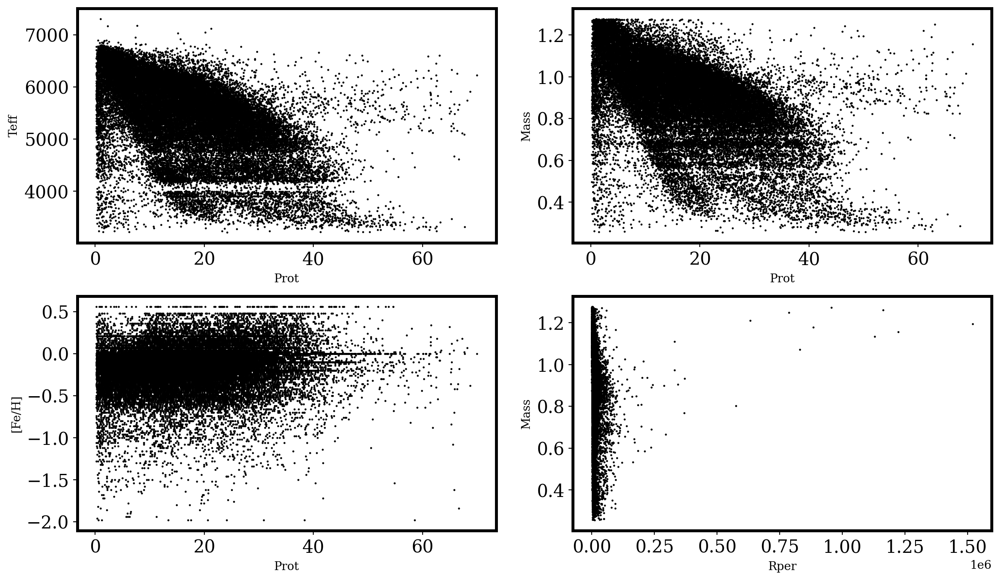

In [ ]:
figure, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(12, 7))

c = 'black'

# Plotting the data
ax1.scatter(merged_table['Prot'], merged_table['Teff'], s=0.5, color=c)
ax1.set_xlabel('Prot')
ax1.set_ylabel('Teff')

ax2.scatter(merged_table['Prot'], merged_table['Mass'], s=0.5, color=c)
ax2.set_xlabel('Prot')
ax2.set_ylabel('Mass')

ax3.scatter(merged_table['Prot'], merged_table['FeH'], s=0.5, color=c)
ax3.set_xlabel('Prot')
ax3.set_ylabel('[Fe/H]')

ax4.scatter(merged_table['Rper'], merged_table['Mass'], s=0.5, color=c)
ax4.set_xlabel('Rper')
ax4.set_ylabel('Mass')

# Make the plot pretty
axis_border_width = 2.5
fontsize_axis_labels = 15

for ax in [ax1, ax2, ax3, ax4]:
    ax.tick_params(axis='both', which='major', labelsize=fontsize_axis_labels)
    ax.spines['top'].set_linewidth(axis_border_width)
    ax.spines['left'].set_linewidth(axis_border_width)
    ax.spines['right'].set_linewidth(axis_border_width)
    ax.spines['bottom'].set_linewidth(axis_border_width)

plt.tight_layout()
plt.show()


##Try subsets

In [ ]:
subset_1 = np.where(merged_table['Teff'] < 4000)
subset_2 = np.where((merged_table['Teff'] >= 4000) & (merged_table['Teff'] < 4500))
subset_3 = np.where((merged_table['Teff'] >= 4500) & (merged_table['Teff'] < 5000))
subset_4 = np.where((merged_table['Teff'] >= 5000) & (merged_table['Teff'] < 5500))
subset_5 = np.where((merged_table['Teff'] >= 5500) & (merged_table['Teff'] < 6000))
subset_6 = np.where(merged_table['Teff'] >= 6000)

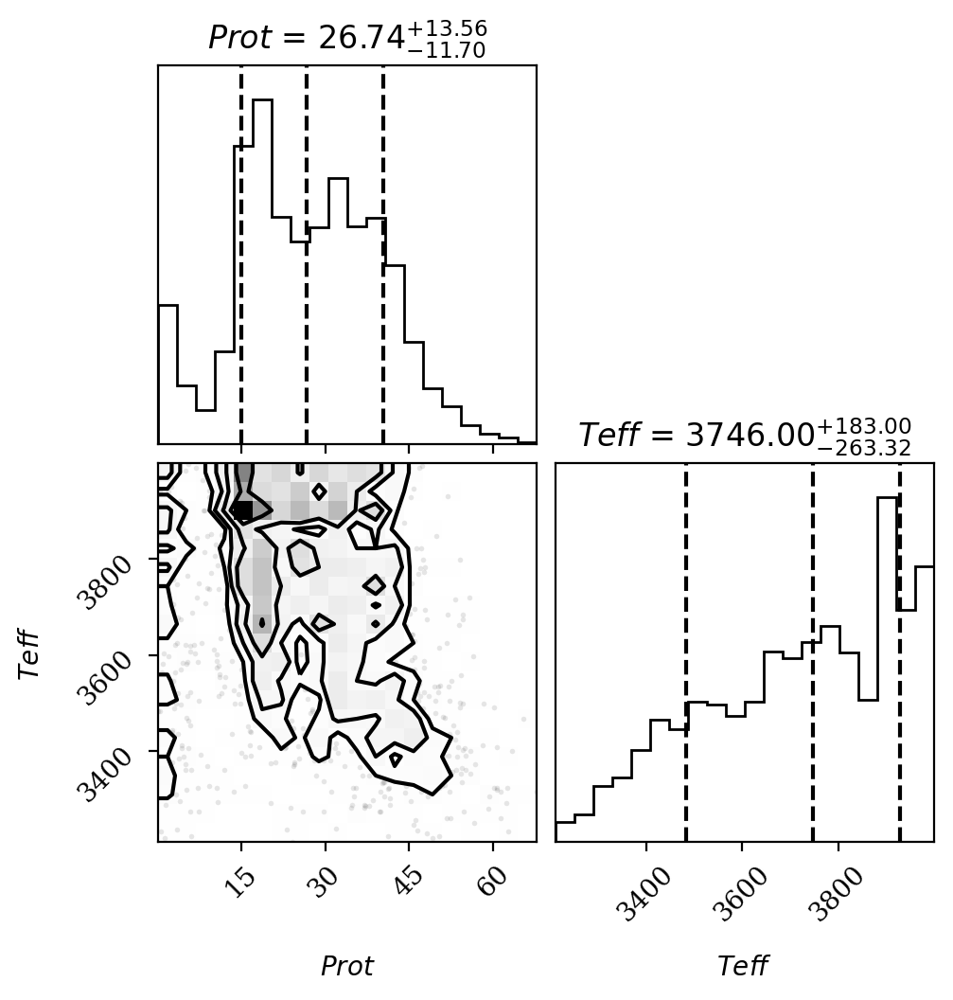

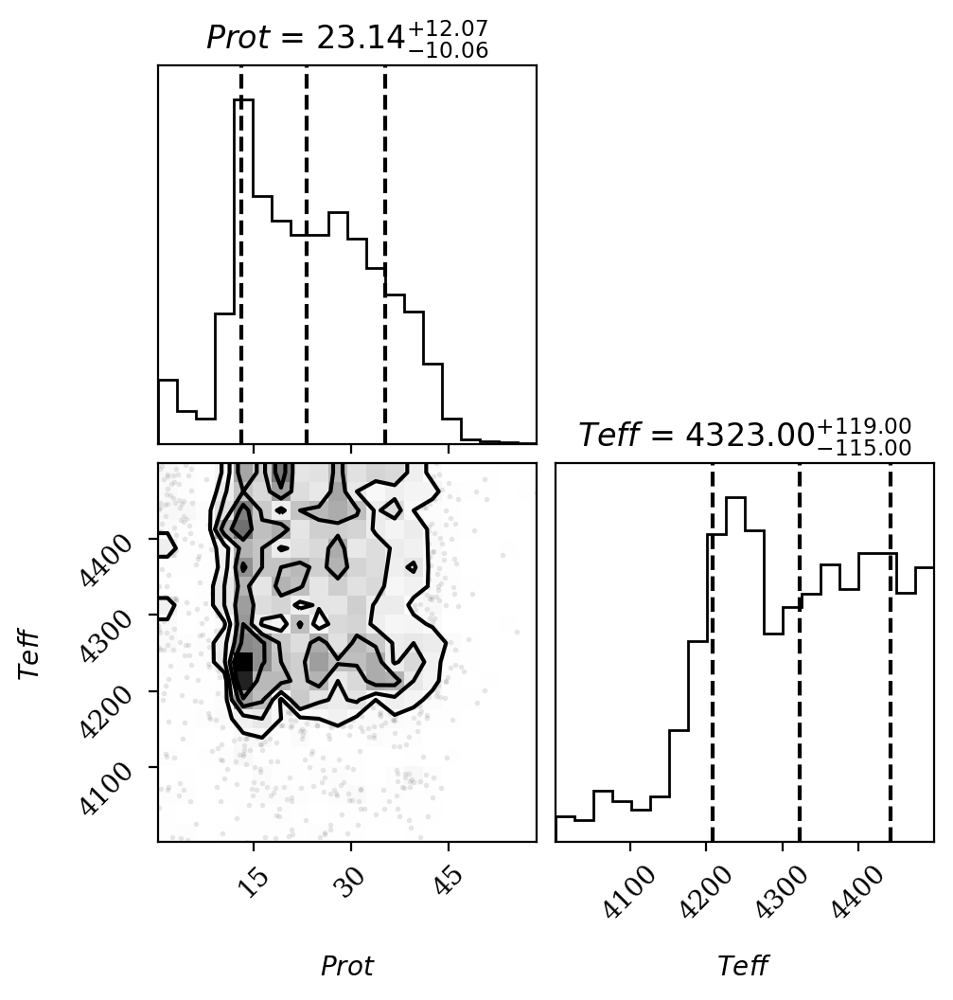

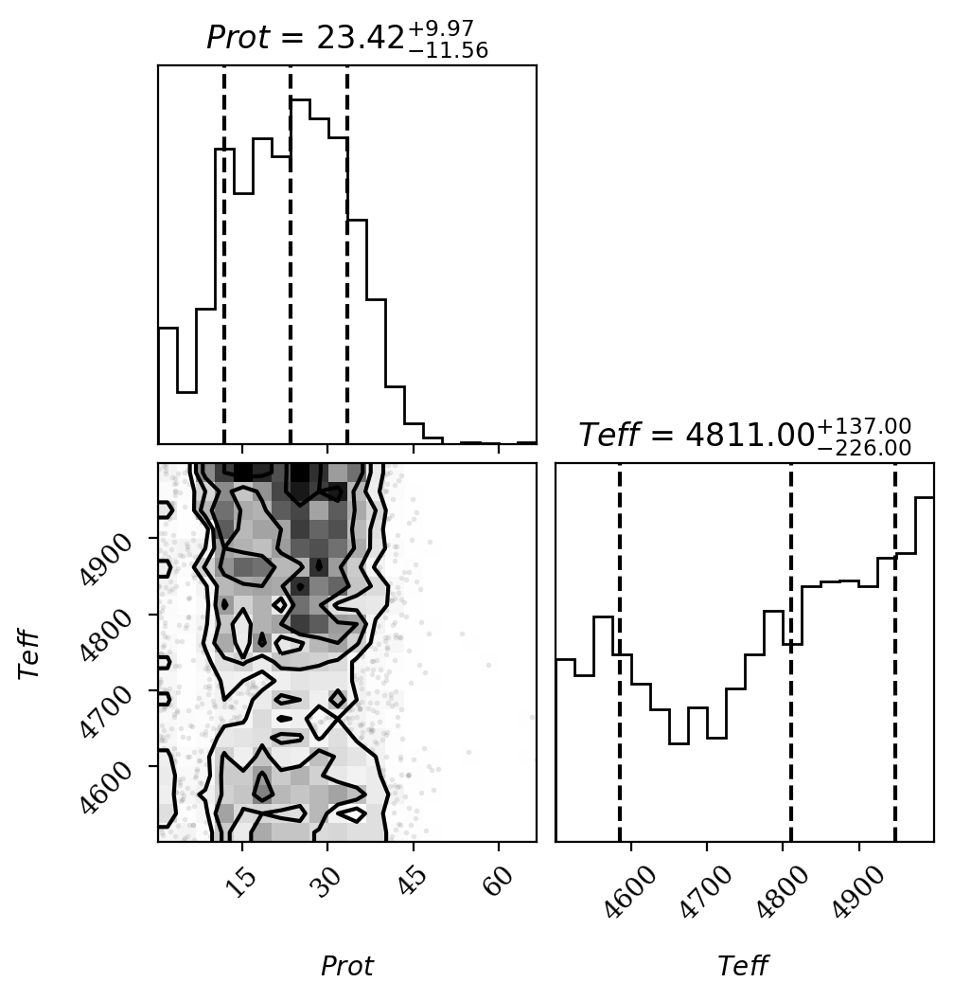

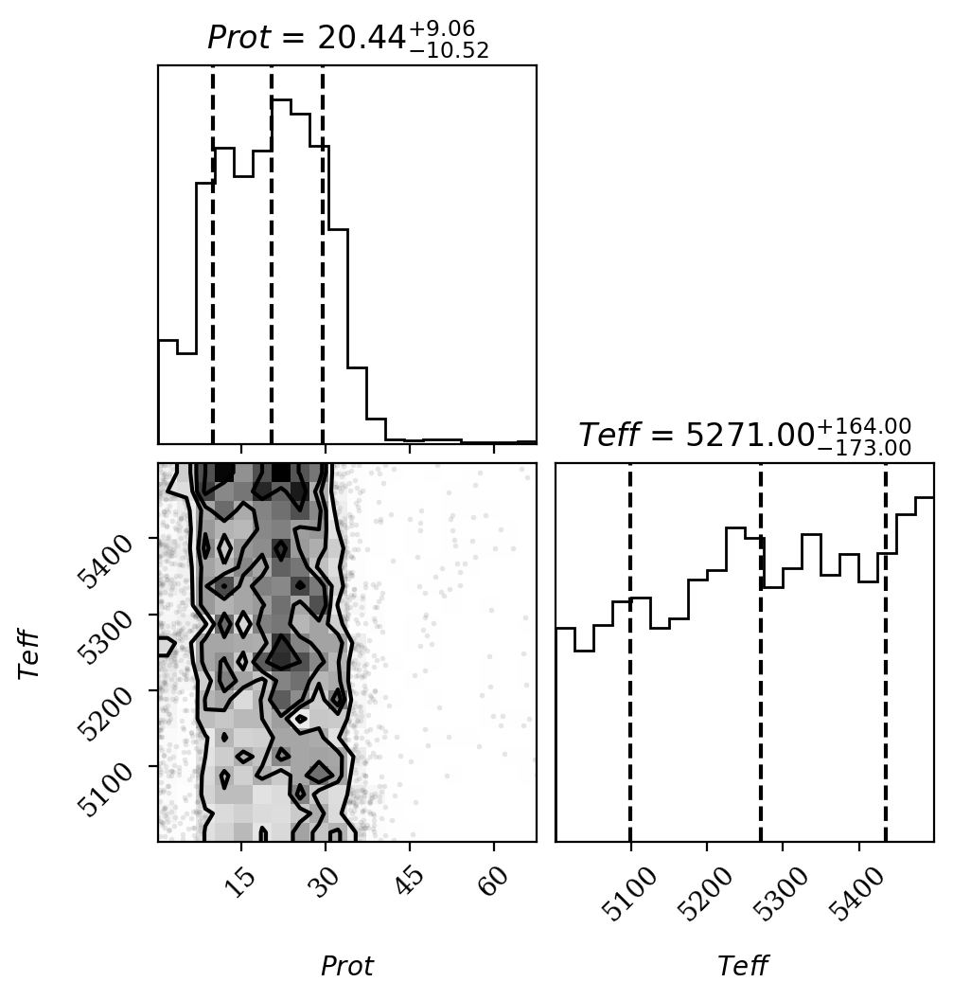

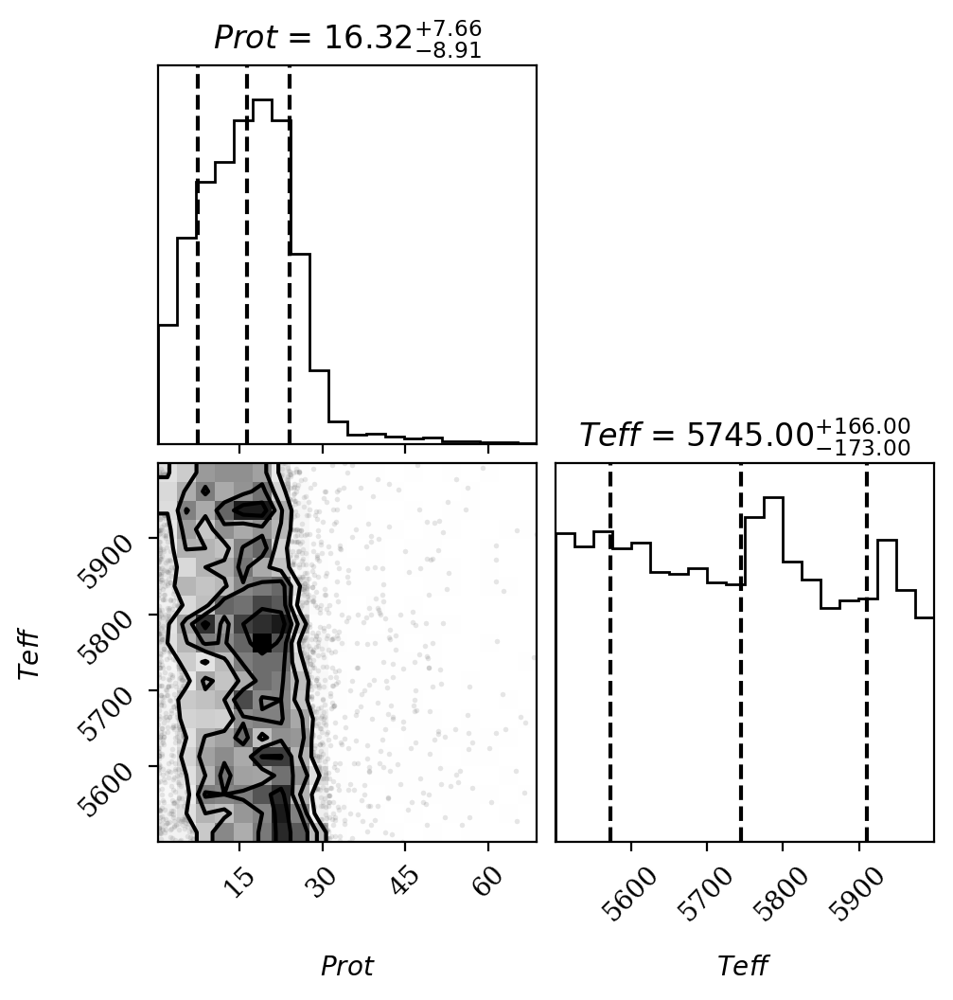

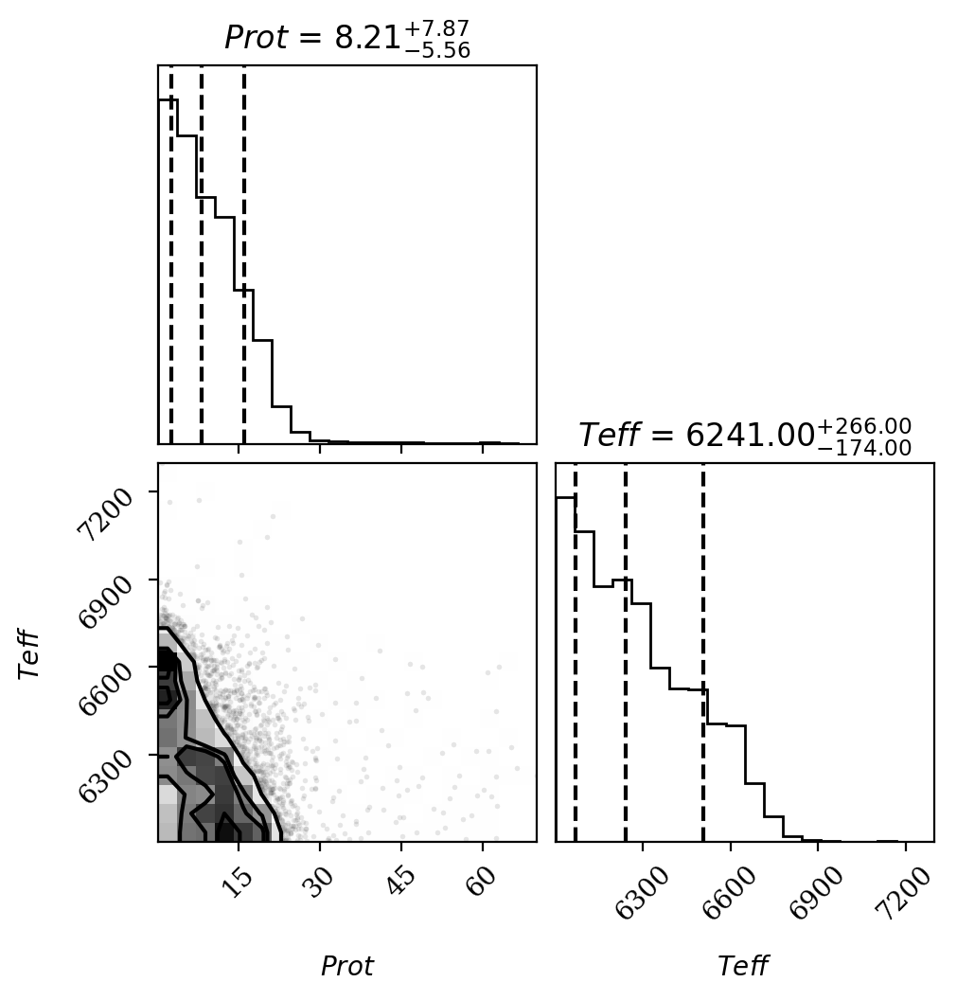

In [ ]:
prot_teff_subset_1 = np.vstack([merged_table['Prot'][subset_1], merged_table['Teff'][subset_1]]).T
prot_teff_subset_2 = np.vstack([merged_table['Prot'][subset_2], merged_table['Teff'][subset_2]]).T
prot_teff_subset_3 = np.vstack([merged_table['Prot'][subset_3], merged_table['Teff'][subset_3]]).T
prot_teff_subset_4 = np.vstack([merged_table['Prot'][subset_4], merged_table['Teff'][subset_4]]).T
prot_teff_subset_5 = np.vstack([merged_table['Prot'][subset_5], merged_table['Teff'][subset_5]]).T
prot_teff_subset_6 = np.vstack([merged_table['Prot'][subset_6], merged_table['Teff'][subset_6]]).T


figure = corner.corner(
    prot_teff_subset_1,
    labels=[
        r"$Prot$",
        r"$Teff$",
    ],
    quantiles=[0.16, 0.5, 0.84],
    show_titles=True,
    title_kwargs={"fontsize": 12},
)



figure = corner.corner(
    prot_teff_subset_2,
    labels=[
        r"$Prot$",
        r"$Teff$",
    ],
    quantiles=[0.16, 0.5, 0.84],
    show_titles=True,
    title_kwargs={"fontsize": 12},
)



figure = corner.corner(
    prot_teff_subset_3,
    labels=[
        r"$Prot$",
        r"$Teff$",
    ],
    quantiles=[0.16, 0.5, 0.84],
    show_titles=True,
    title_kwargs={"fontsize": 12},
)

figure = corner.corner(
    prot_teff_subset_4,
    labels=[
        r"$Prot$",
        r"$Teff$",
    ],
    quantiles=[0.16, 0.5, 0.84],
    show_titles=True,
    title_kwargs={"fontsize": 12},
)

figure = corner.corner(
    prot_teff_subset_5,
    labels=[
        r"$Prot$",
        r"$Teff$",
    ],
    quantiles=[0.16, 0.5, 0.84],
    show_titles=True,
    title_kwargs={"fontsize": 12},
)

figure = corner.corner(
    prot_teff_subset_6,
    labels=[
        r"$Prot$",
        r"$Teff$",
    ],
    quantiles=[0.16, 0.5, 0.84],
    show_titles=True,
    title_kwargs={"fontsize": 12},
)

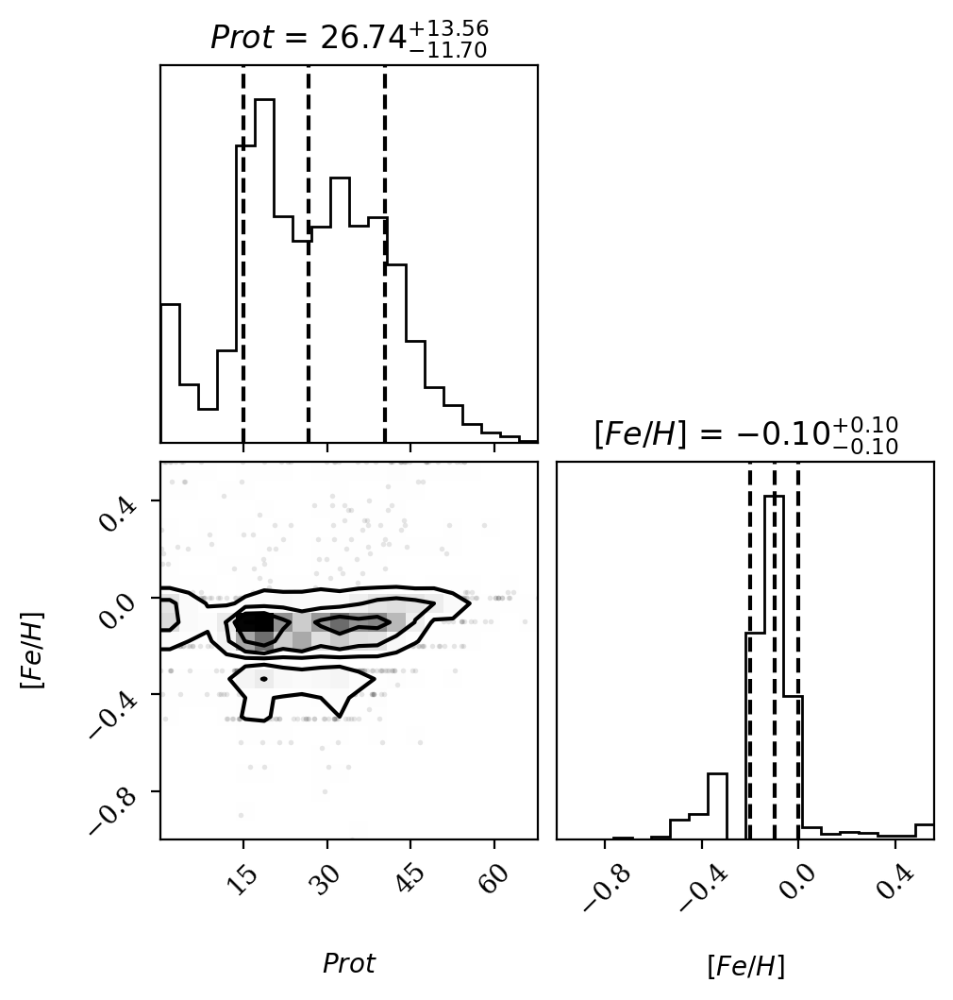

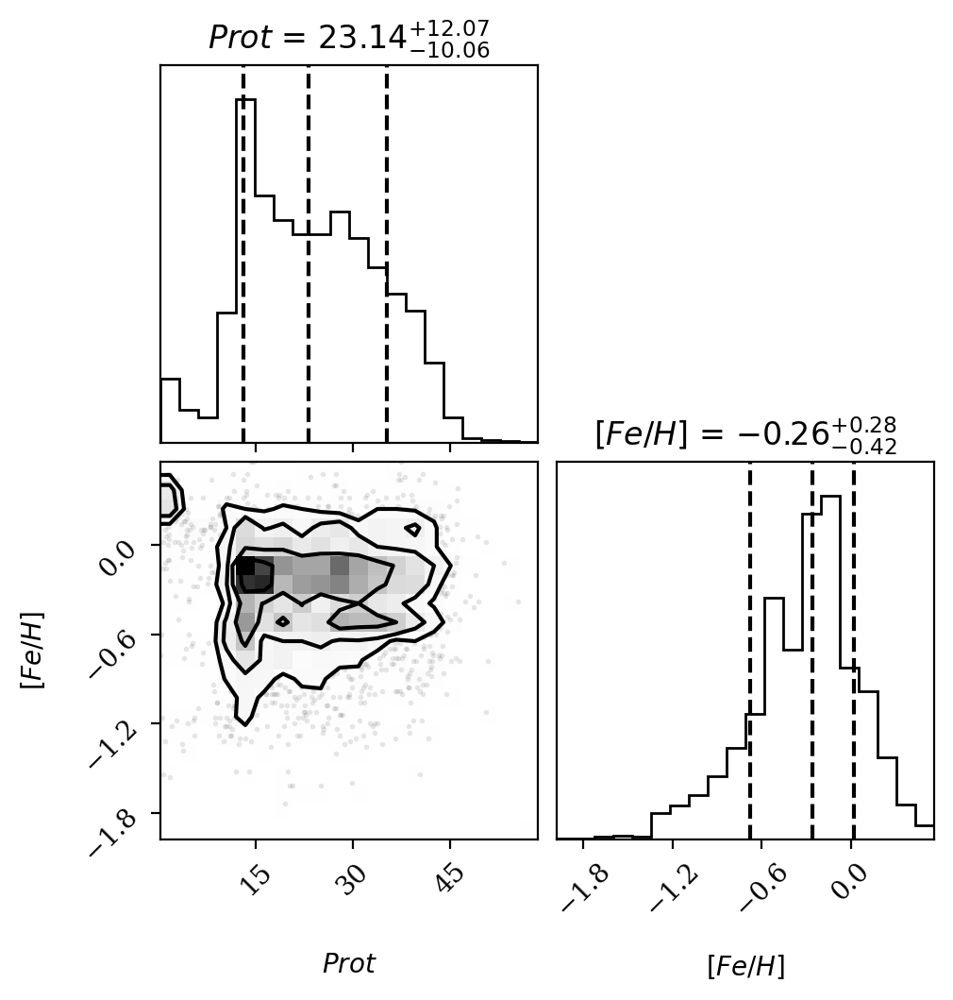

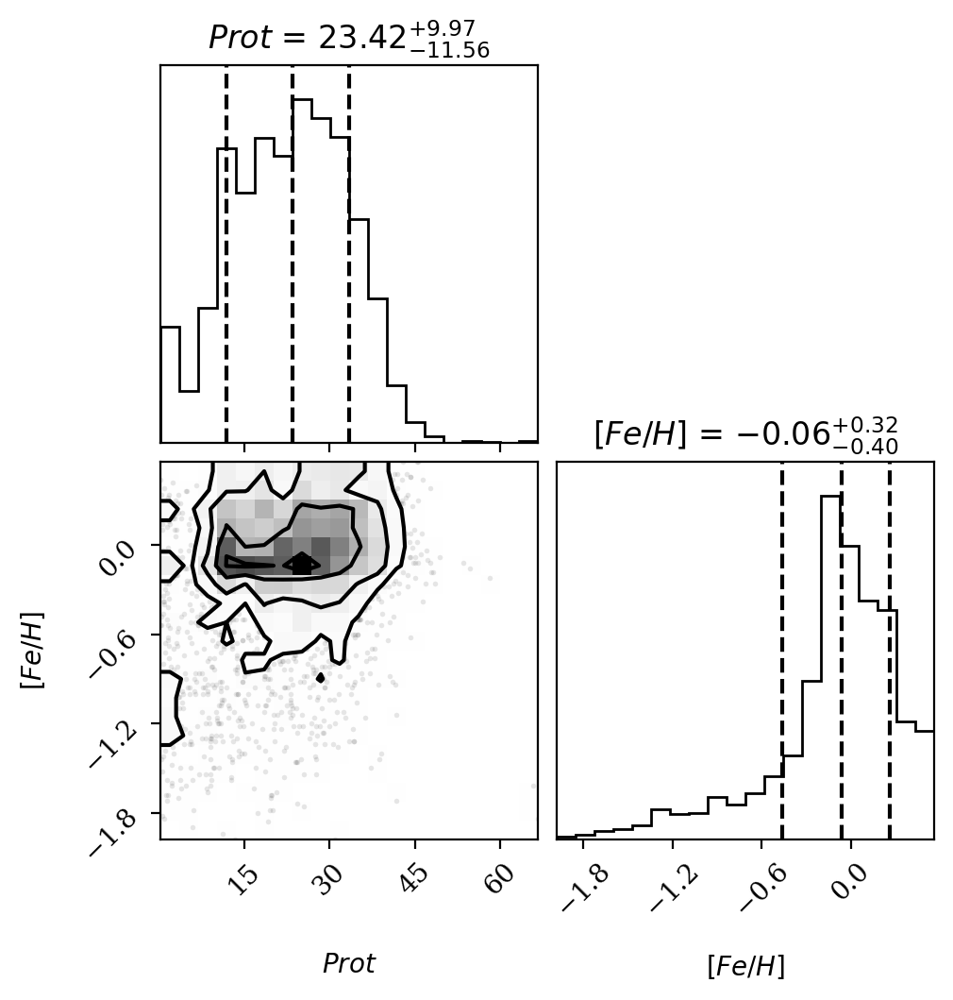

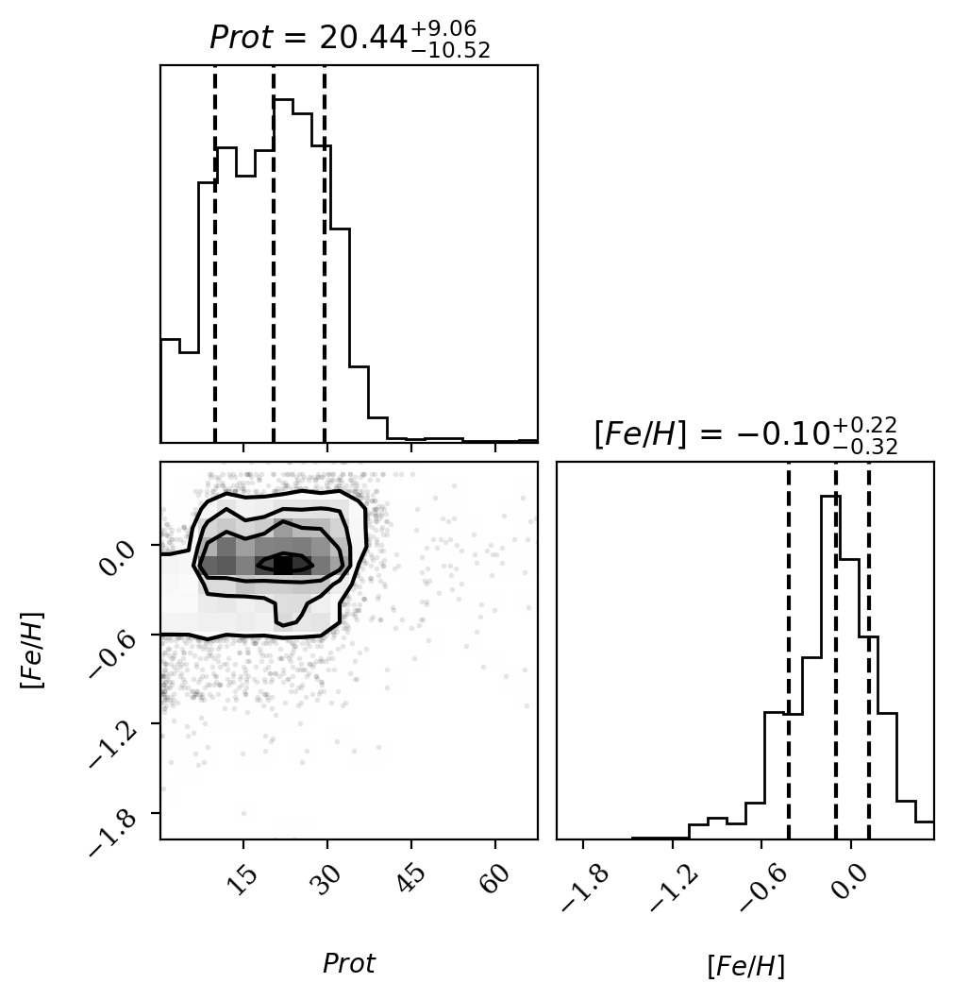

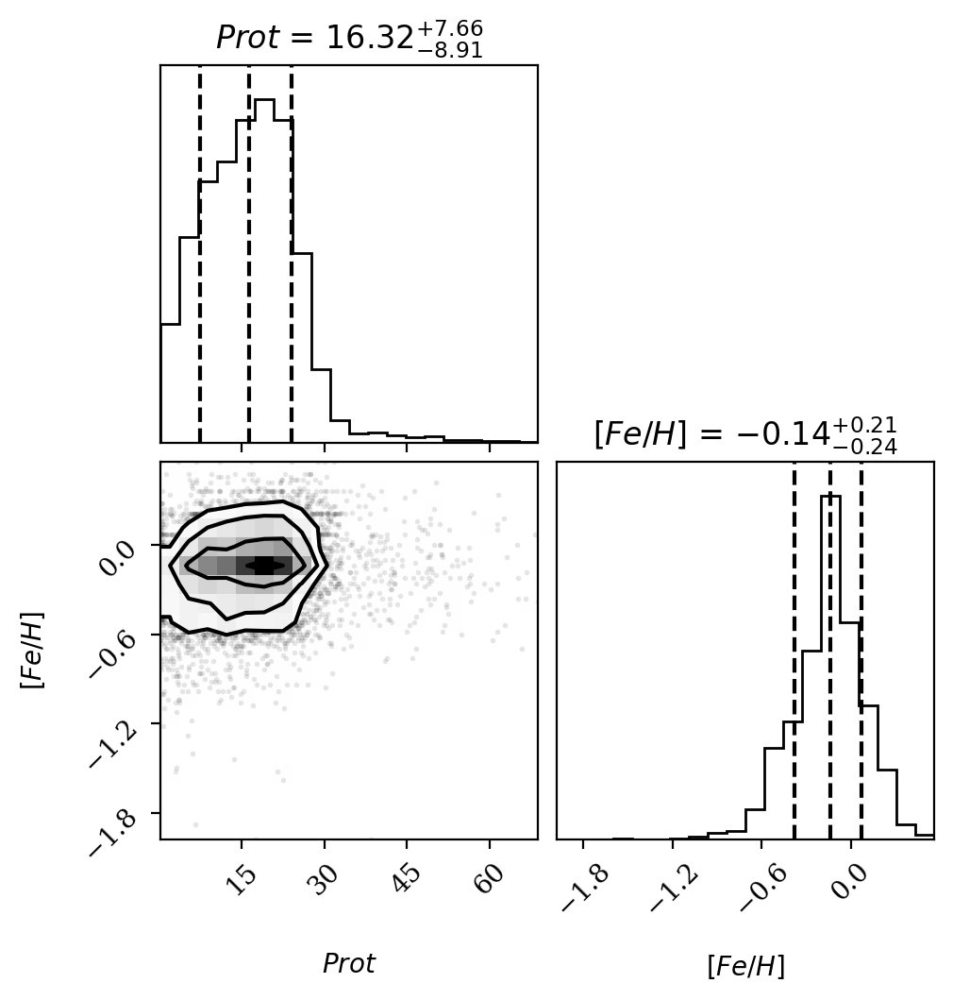

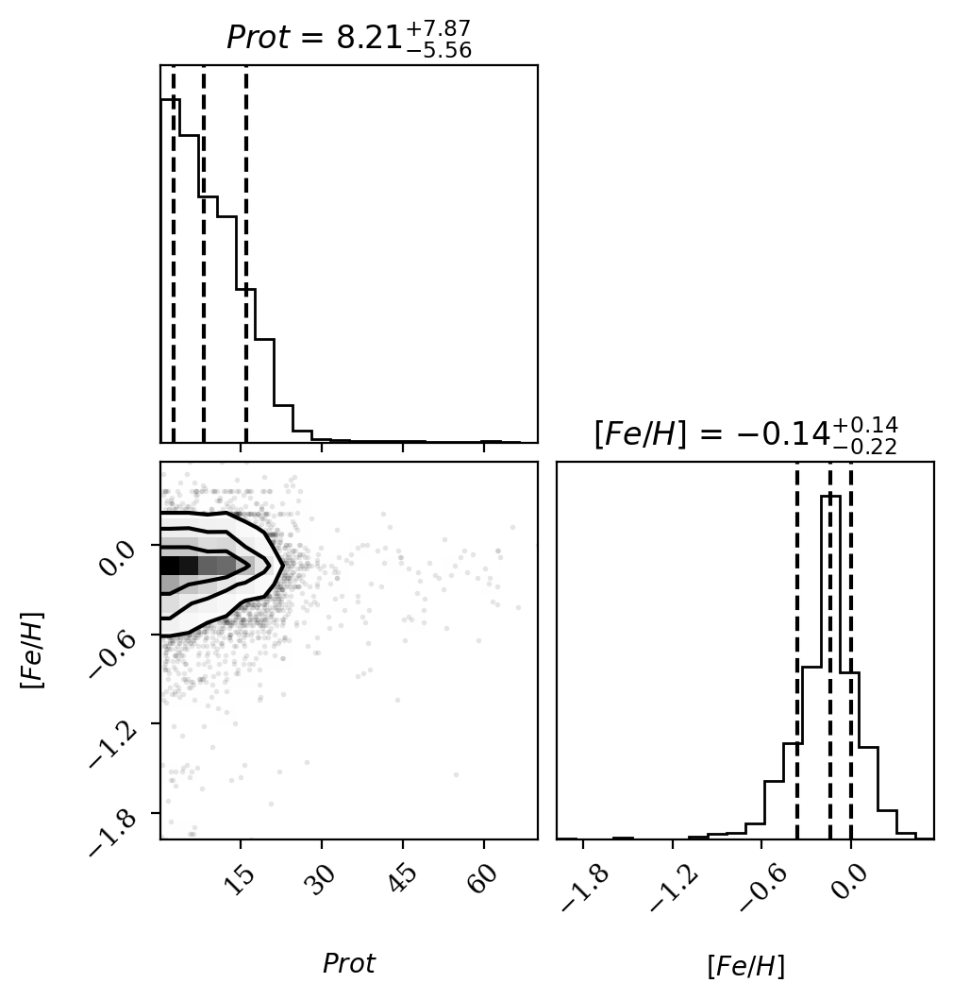

In [ ]:
prot_feh_subset_1 = np.vstack([merged_table['Prot'][subset_1], merged_table['FeH'][subset_1]]).T
prot_feh_subset_2 = np.vstack([merged_table['Prot'][subset_2], merged_table['FeH'][subset_2]]).T
prot_feh_subset_3 = np.vstack([merged_table['Prot'][subset_3], merged_table['FeH'][subset_3]]).T
prot_feh_subset_4 = np.vstack([merged_table['Prot'][subset_4], merged_table['FeH'][subset_4]]).T
prot_feh_subset_5 = np.vstack([merged_table['Prot'][subset_5], merged_table['FeH'][subset_5]]).T
prot_feh_subset_6 = np.vstack([merged_table['Prot'][subset_6], merged_table['FeH'][subset_6]]).T


figure = corner.corner(
    prot_feh_subset_1,
    labels=[
        r"$Prot$",
        r"$[Fe/H]$",
    ],
    quantiles=[0.16, 0.5, 0.84], #might need to adjust these values
    show_titles=True,
    title_kwargs={"fontsize": 12},
)



figure = corner.corner(
    prot_feh_subset_2,
    labels=[
        r"$Prot$",
        r"$[Fe/H]$",
    ],
    quantiles=[0.16, 0.5, 0.84], #might need to adjust these values
    show_titles=True,
    title_kwargs={"fontsize": 12},
)



figure = corner.corner(
    prot_feh_subset_3,
    labels=[
        r"$Prot$",
        r"$[Fe/H]$",
    ],
    quantiles=[0.16, 0.5, 0.84], #might need to adjust these values
    show_titles=True,
    title_kwargs={"fontsize": 12},
)

figure = corner.corner(
    prot_feh_subset_4,
    labels=[
        r"$Prot$",
        r"$[Fe/H]$",
    ],
    quantiles=[0.16, 0.5, 0.84], #might need to adjust these values
    show_titles=True,
    title_kwargs={"fontsize": 12},
)

figure = corner.corner(
    prot_feh_subset_5,
    labels=[
        r"$Prot$",
        r"$[Fe/H]$",
    ],
    quantiles=[0.16, 0.5, 0.84], #might need to adjust these values
    show_titles=True,
    title_kwargs={"fontsize": 12},
)

figure = corner.corner(
    prot_feh_subset_6,
    labels=[
        r"$Prot$",
        r"$[Fe/H]$",
    ],
    quantiles=[0.16, 0.5, 0.84], #might need to adjust these values
    show_titles=True,
    title_kwargs={"fontsize": 12},
)

##Recreate MCQuillan corner plot (also to plot Prot and Rrot against eachother)

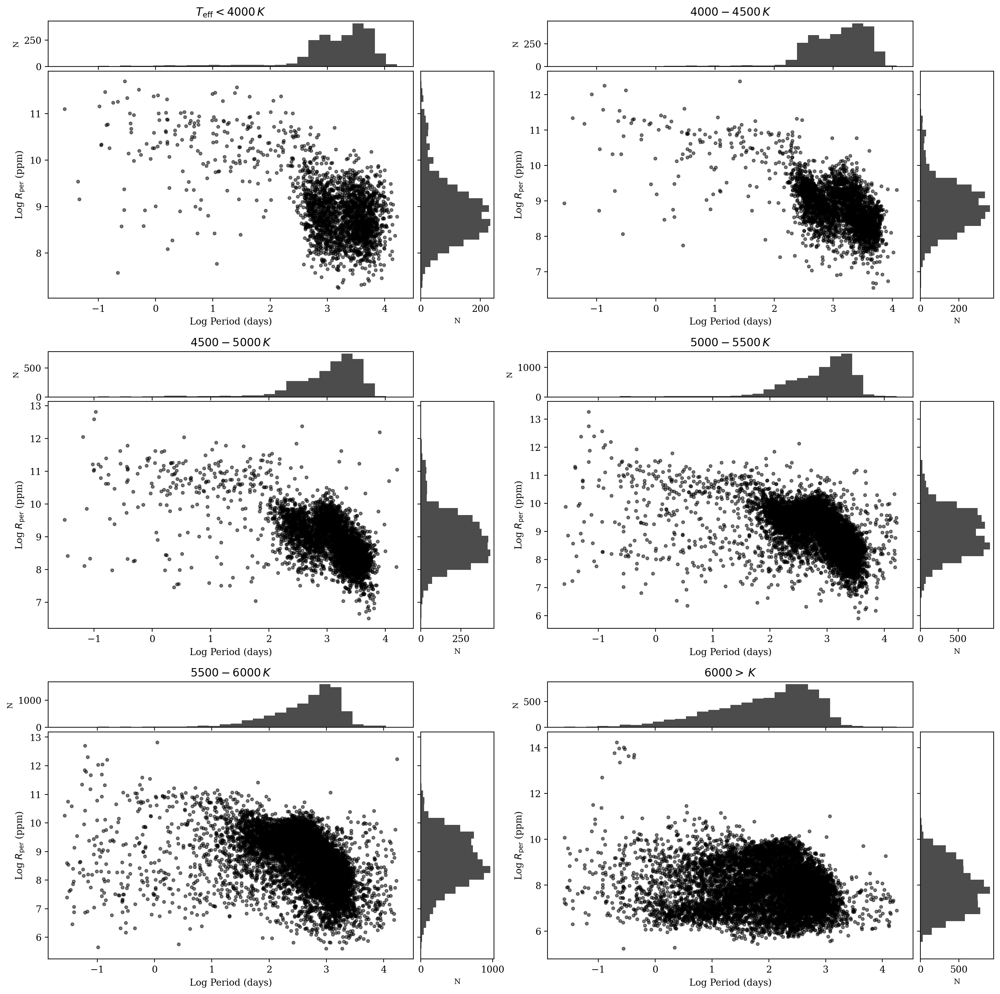

In [ ]:
teff_bins = [subset_1, subset_2, subset_3, subset_4, subset_5, subset_6]
teff_labels = [r"$T_{\mathrm{eff}} < 4000\,K$",
               r"$4000-4500\,K$", r"$4500-5000\,K$",
               r"$5000-5500\,K$", r"$5500-6000\,K$", r"$6000>\,K$"]

# Create subplots
fig, axes = plt.subplots(3, 2, figsize=(15, 15), constrained_layout=True)
axes = axes.flatten()

# Loop through each temperature bin and plot
for i, (indices, label) in enumerate(zip(teff_bins, teff_labels)):
    # Extract data using indices
    subset = merged_table[indices]
    log_period = np.log(subset['Prot'])
    log_rper = np.log(subset['Rper'])

    # Main scatter plot
    ax_main = axes[i]
    ax_main.scatter(log_period, log_rper, color="black", alpha=0.5, s=10)
    ax_main.set_xlabel("Log Period (days)", fontsize=10)
    ax_main.set_ylabel(r"Log $R_{\mathrm{per}}$ (ppm)", fontsize=10)
    ax_main.set_title(label, fontsize=12)

    # Histogram for x-axis (log_period)
    ax_hist_x = ax_main.inset_axes([0, 1.02, 1, 0.2], transform=ax_main.transAxes)
    ax_hist_x.hist(log_period, bins=30, color="black", alpha=0.7)
    ax_hist_x.set_ylabel("N", fontsize=8)  # Add label for counts
    ax_hist_x.tick_params(axis="x", labelbottom=False)  # Remove x-ticks to avoid redundancy

    # Histogram for y-axis (log_rper)
    ax_hist_y = ax_main.inset_axes([1.02, 0, 0.2, 1], transform=ax_main.transAxes)
    ax_hist_y.hist(log_rper, bins=30, color="black", alpha=0.7, orientation="horizontal")
    ax_hist_y.set_xlabel("N", fontsize=8)  # Add label for counts
    ax_hist_y.tick_params(axis="y", labelleft=False)  # Remove y-ticks to avoid redundancy

# Adjust layout and show

# Make the plot pretty
axis_border_width = 2.5
fontsize_axis_labels = 15


ax.tick_params(axis='both', which='major', labelsize=fontsize_axis_labels)
ax.spines['top'].set_linewidth(axis_border_width)
ax.spines['left'].set_linewidth(axis_border_width)
ax.spines['right'].set_linewidth(axis_border_width)
ax.spines['bottom'].set_linewidth(axis_border_width)

plt.tight_layout()
plt.show()


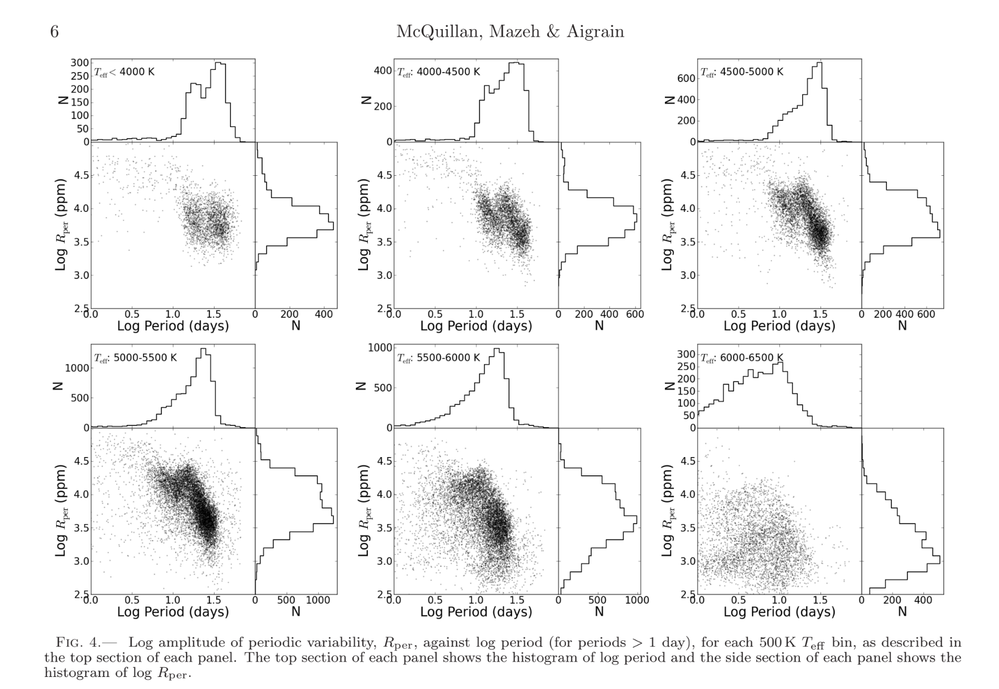

#**4. Envelope Function of Prot vs Teff**

If nothing else, you should certainly be able to do an envelope
function of Prot vs Teff, predict allowed range of Teff | Prot. Could
also explore ML methods here for predictions

In [ ]:
def sliding_window_envelope(signal, window_size):
    """
    Compute the upper and lower envelopes of a signal using a changing kernel/sliding window, akin to/in lieu of a moving median; Chose a slice of rotation period & calculate min and max using envelope quantiles

    Parameters:
    - signal: array-like, the input signal.
    - window_size: int, size of the sliding window.

    Returns:
    - lower_envelope: array-like, the lower envelope (5th percentile).
    - upper_envelope: array-like, the upper envelope (95th percentile).
    """
    # Initialize empty arrays for lower and upper envelopes
    lower_envelope = []
    upper_envelope = []

    # Compute sliding percentiles
    half_window = window_size // 2
    for i in range(len(signal)):
        # Define the sliding kernel range
        start = max(0, i - half_window)
        end = min(len(signal), i + half_window + 1)

        # Extract the window and compute 95% and 5% percentiles
        kernel = signal[start:end]
        lower_envelope.append(np.percentile(kernel, 5))
        upper_envelope.append(np.percentile(kernel, 95))

    return np.array(lower_envelope), np.array(upper_envelope)


In [ ]:
# Define the window size
window_size = 50 #this needs to be high given the volume of data

# Extract the data from the merged_table
prot = merged_table['Prot']
teff = merged_table['Teff']

# Sort data by Prot
sort = np.argsort(prot)
prot_sorted = prot[sort]
teff_sorted = teff[sort]

# Compute envelopes for Teff with respect to Prot
low_env_teff, high_env_teff = sliding_window_envelope(teff_sorted, window_size)


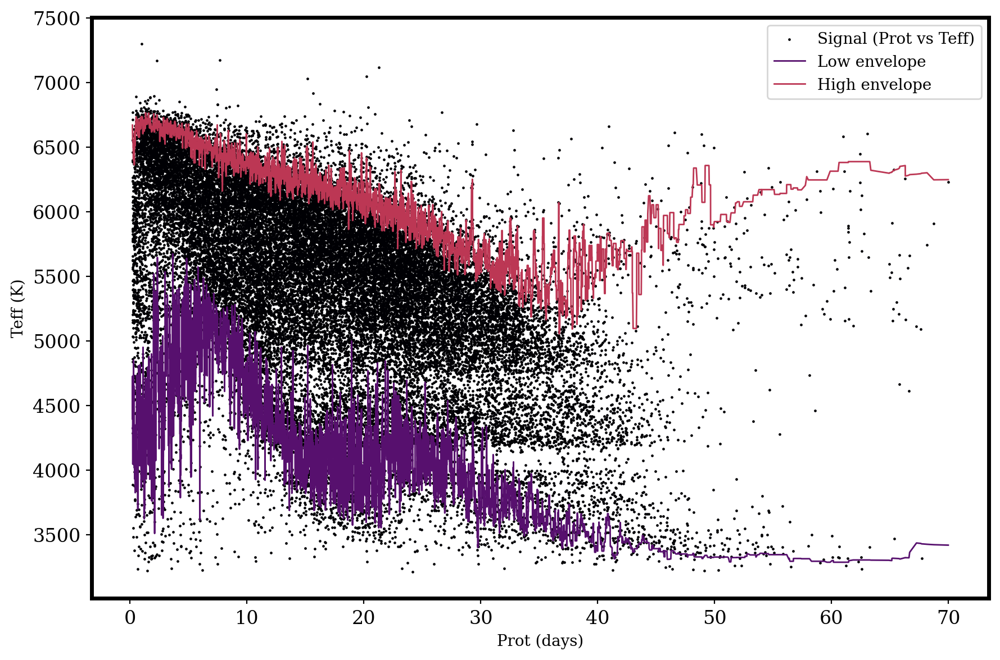

Low envelope: [4423.   4450.6  4478.2  ... 3424.45 3421.1  3417.75]
High envelope: [6668.75 6660.7  6655.45 ... 6299.8  6245.2  6246.5 ]


In [ ]:
# Plotting Teff vs Prot with envelopes; show results

figure, ax = plt.subplots(figsize=(9, 6))

ax.scatter(prot_sorted, teff_sorted, label="Signal (Prot vs Teff)", color="#000004", s = 0.5)
ax.plot(prot_sorted, low_env_teff, label="Low envelope", color="#57106e", linewidth=1)
ax.plot(prot_sorted, high_env_teff, label="High envelope", color="#bc3754", linewidth=1)
ax.legend()
#ax.set_title("Teff vs Prot with Envelopes")
ax.set_xlabel("Prot (days)")
ax.set_ylabel("Teff (K)")

# Make the plot pretty
axis_border_width = 2.5
fontsize_axis_labels = 12


ax.tick_params(axis='both', which='major', labelsize=fontsize_axis_labels)
ax.spines['top'].set_linewidth(axis_border_width)
ax.spines['left'].set_linewidth(axis_border_width)
ax.spines['right'].set_linewidth(axis_border_width)
ax.spines['bottom'].set_linewidth(axis_border_width)

plt.tight_layout()
plt.show()

print(f'Low envelope: {low_env_teff}')
print(f'High envelope: {high_env_teff}')

#**5. Cross-validation**

Cross-validate your prediction on some censored data to prove it works. If you using parametric models use model selection to prove your model is optimal.

*See lecture 10 for notes on cross validation

In [ ]:
#Set up
x = merged_table['Prot']
y = merged_table['Teff']
sigma = (np.abs(merged_table['eTeff+']) + np.abs(merged_table['eTeff-']))/2 #Average error

#Define chi2 function (from lecture 10 example code)
def chisquared(res, err):
    chi2 = 0.0
    for i in range(len(res)):
        chi2 += (res[i] / err[i])**2
    return chi2


# Polynomial degrees
degrees = [1, 2, 3, 4]

#Number of iterations
iterations = 1000 #Lecture 10 slide 31 suggests 10000 but given the nature of colab, that is very compuationally expensive

##Polyfit attempt 1: Adapting lecture notes

Lecture notes were also used for the intial setup

In [ ]:
%%skip #comment this if you would like to run it, however attempt #2 yields the correct fits, it was my aim to show my thinking/process

for i in range(iterations):

  #Split into training vs validation set
  p = int(0.3 * len(merged_table)) # Number of points to leave out as percentage of total dataset (validation set)

  # Store fits for the percentiles
  percentile_5th_fits = {}
  percentile_95th_fits = {}

  # Store chi-squared for 5th and 95th percentile fits
  chi2_5th = {}
  chi2_95th = {}

  # Initialize validation and training sets
  xval = [0 for i in range(p)]
  #xval = np.sort(xval)
  yval = [0 for i in range(p)]

  xtra = [0 for i in range(len(x) - p)]
  #xtra = np.sort(xtra)
  ytra = [0 for i in range(len(x) - p)]

  # Random choice of indices for validation set
  valchoices = np.random.choice(range(len(x)), p, replace=False)
  trachoices = np.setdiff1d(range(len(x)), valchoices)

  # Fill validation set
  for i in range(len(valchoices)):
      xval[i] = x[valchoices[i]]
      yval[i] = y[valchoices[i]]


  # Fill training set
  for i in range(len(trachoices)):
      xtra[i] = x[trachoices[i]]
      ytra[i] = y[trachoices[i]]


  for degree in degrees:
      # Initial polynomial fit
      poly_coeffs = np.polyfit(xtra, ytra, degree)
      # poly_coeffs = poly_coeffs[::-1]
      fitted_model = np.polyval(poly_coeffs, xtra)

      # Calculate residuals
      residuals = ytra - fitted_model
      abs_residuals = np.abs(residuals)

      # Calculate weights inversely proportional to residuals
      weights = 1 / (abs_residuals + 1e-6)  # Add a small constant to avoid division by zero

      # Calculate 5th and 95th percentiles of residuals
      residuals_95th = np.percentile(residuals, 95)
      residuals_5th = np.percentile(residuals, 5)

      # Calculate the upper and lower bounds using percentiles
      upper_bound = fitted_model + residuals_95th
      lower_bound = fitted_model + residuals_5th

      # Fit polynomials to the upper and lower bounds with weights
      percentile_5th_fits[degree] = np.polyfit(xtra, lower_bound, degree, w=weights)
      percentile_95th_fits[degree] = np.polyfit(xtra, upper_bound, degree, w=weights)




# Create polynomial functions from the fitted coefficients
fn_5th_fits = {degree: np.polyval(percentile_5th_fits[degree], xtra) for degree in degrees}
fn_95th_fits = {degree: np.polyval(percentile_95th_fits[degree], xtra) for degree in degrees}

errors = sigma

for degree in degrees:
    residuals_5th = ytra - fn_5th_fits[degree]
    residuals_95th = ytra - fn_95th_fits[degree]
    chi2_5th[degree] = chisquared(residuals_5th, errors)
    chi2_95th[degree] = chisquared(residuals_95th, errors)

# Print chi-squared values for comparison
for degree in degrees:
    print(f'Chi-squared for 5th percentile (Degree {degree}): {chi2_5th[degree]}')
    print(f'Chi-squared for 95th percentile (Degree {degree}): {chi2_95th[degree]}')


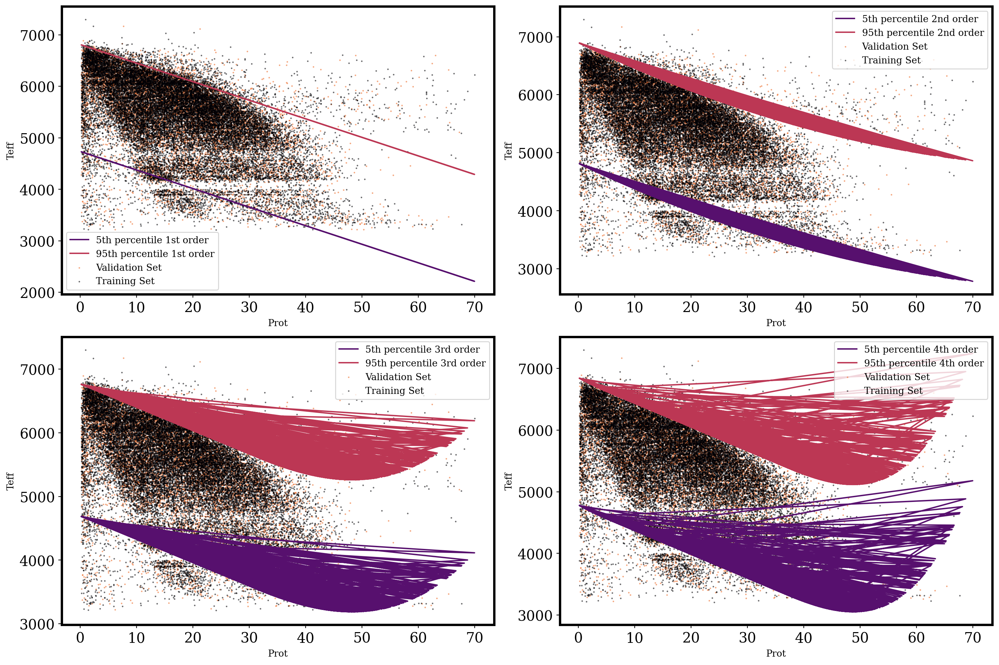

In [ ]:
%%skip #comment this if you would like to run it, however attempt #2 yields the correct fits, it was my aim to show my thinking/process

# Plot results
figure, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 10))

# 1st order polynomial fit
ax1.plot(xtra, fn_5th_fits[1], '#57106e', label = '5th percentile 1st order')
ax1.plot(xtra, fn_95th_fits[1], '#bc3754', label = '95th percentile 1st order')
ax1.scatter(xval, yval, color='#ed6925', label='Validation Set', s=0.5, alpha = 0.5)
ax1.scatter(xtra, ytra, color='#000004', label='Training Set', s=0.5, alpha = 0.5)
ax1.set_xlabel('Prot')
ax1.set_ylabel('Teff')
ax1.legend()

# 2nd order polynomial fit
ax2.plot(xtra, fn_5th_fits[2], '#57106e', label = '5th percentile 2nd order')
ax2.plot(xtra, fn_95th_fits[2], '#bc3754', label = '95th percentile 2nd order')
ax2.scatter(xval, yval, color='#ed6925', label='Validation Set', s=0.5, alpha = 0.5)
ax2.scatter(xtra, ytra, color='#000004', label='Training Set', s=0.5, alpha = 0.5)
ax2.set_xlabel('Prot')
ax2.set_ylabel('Teff')
ax2.legend()

# 3rd order polynomial fit
ax3.plot(xtra, fn_5th_fits[3], '#57106e', label = '5th percentile 3rd order')
ax3.plot(xtra, fn_95th_fits[3], '#bc3754', label = '95th percentile 3rd order')
ax3.scatter(xval, yval, color='#ed6925', label='Validation Set', s=0.5, alpha = 0.5)
ax3.scatter(xtra, ytra, color='#000004', label='Training Set', s=0.5, alpha = 0.5)
ax3.set_xlabel('Prot')
ax3.set_ylabel('Teff')
ax3.legend()

# 4th order polynomial fit
ax4.plot(xtra, fn_5th_fits[4], '#57106e', label = '5th percentile 4th order')
ax4.plot(xtra, fn_95th_fits[4], '#bc3754', label = '95th percentile 4th order')
ax4.scatter(xval, yval,color='#ed6925', label='Validation Set', s=0.5, alpha = 0.5)
ax4.scatter(xtra, ytra, color='#000004', label='Training Set', s=0.5, alpha = 0.5)
ax4.set_xlabel('Prot')
ax4.set_ylabel('Teff')
ax4.legend()

# Make the plot pretty
axis_border_width = 2.5
fontsize_axis_labels = 15

for ax in [ax1, ax2, ax3, ax4]:
    ax.tick_params(axis='both', which='major', labelsize=fontsize_axis_labels)
    ax.spines['top'].set_linewidth(axis_border_width)
    ax.spines['left'].set_linewidth(axis_border_width)
    ax.spines['right'].set_linewidth(axis_border_width)
    ax.spines['bottom'].set_linewidth(axis_border_width)

plt.tight_layout()
plt.show()

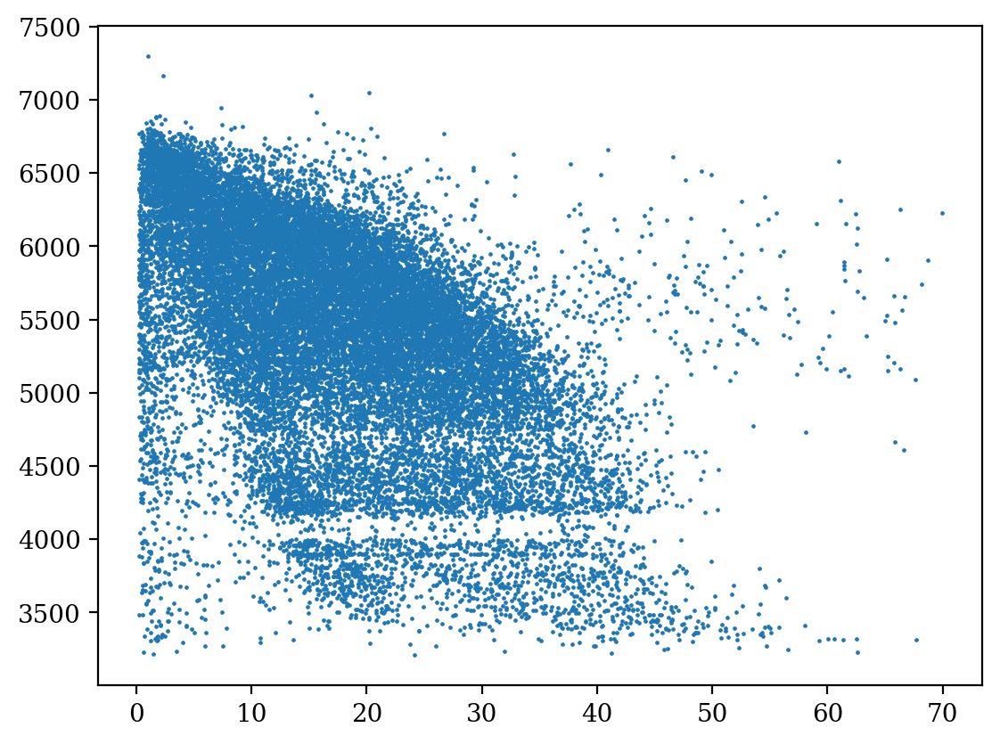

In [ ]:
plt.scatter(xtra, ytra, s=0.5) #Check training data

Something seems to be wrogn with the sorting, likely in using random x values, such that I have not been able to sort them correctly.

##Polyfit Attempt #2: Using sklearn.model_selection.train_test_split to divide training and validation data (often used for spliting data into training/validation for machine learning models)

In [ ]:
# Polynomial function degrees
degrees = degrees
iterations = iterations

# Dictionary to store results
results = {
    degree: {
        'coefficients': None,
        'chi2_5th': [],
        'chi2_95th': [],
        'lower_fit': None,
        'upper_fit': None
    } for degree in degrees
}

for degree in degrees:
    print(f"Testing degree: {degree}")

    for i in range(iterations):
        # Split into training and validation sets
        xtra, xval, ytra, yval = train_test_split(x, y, test_size=0.3, random_state=i)

        # Sort training set for polyfit
        sorted_indices = np.argsort(xtra)
        xtra = np.array(xtra)[sorted_indices]
        ytra = np.array(ytra)[sorted_indices]

        # Fit polynomial for current degree
        coefficients = np.polyfit(xtra, ytra, degree)
        results[degree]['coefficients'] = coefficients

        # Evaluate polynomial fit
        y_fit = np.polyval(coefficients, xtra)

        # Calculate residuals
        residuals = ytra - y_fit

        # Compute 5th and 95th percentile bounds
        lower_bound = y_fit + np.percentile(residuals, 5)
        upper_bound = y_fit + np.percentile(residuals, 95)

        # Store these bounds as fits
        results[degree]['lower_fit'] = lower_bound
        results[degree]['upper_fit'] = upper_bound

        # Calculate residuals for bounds
        residuals_5th = ytra - lower_bound
        residuals_95th = ytra - upper_bound

        # Compute chi-squared
        error = sigma
        chi2_5th = chisquared(residuals_5th, error)
        chi2_95th = chisquared(residuals_95th, error)

        results[degree]['chi2_5th'].append(chi2_5th)
        results[degree]['chi2_95th'].append(chi2_95th)

# Print chi2
for degree in degrees:
    print(f"Degree {degree}:")
    print(f"Avg Chi-squared (5th): {np.mean(results[degree]['chi2_5th']):.2f}")
    print(f"Avg Chi-squared (95th): {np.mean(results[degree]['chi2_95th']):.2f}")


Testing degree: 1
Testing degree: 2
Testing degree: 3
Testing degree: 4
Degree 1:
  Avg Chi-squared (5th): 2957284.51
  Avg Chi-squared (95th): 1511414.34
Degree 2:
  Avg Chi-squared (5th): 2930147.52
  Avg Chi-squared (95th): 1534292.06
Degree 3:
  Avg Chi-squared (5th): 2934859.79
  Avg Chi-squared (95th): 1508088.56
Degree 4:
  Avg Chi-squared (5th): 2929571.15
  Avg Chi-squared (95th): 1493067.85


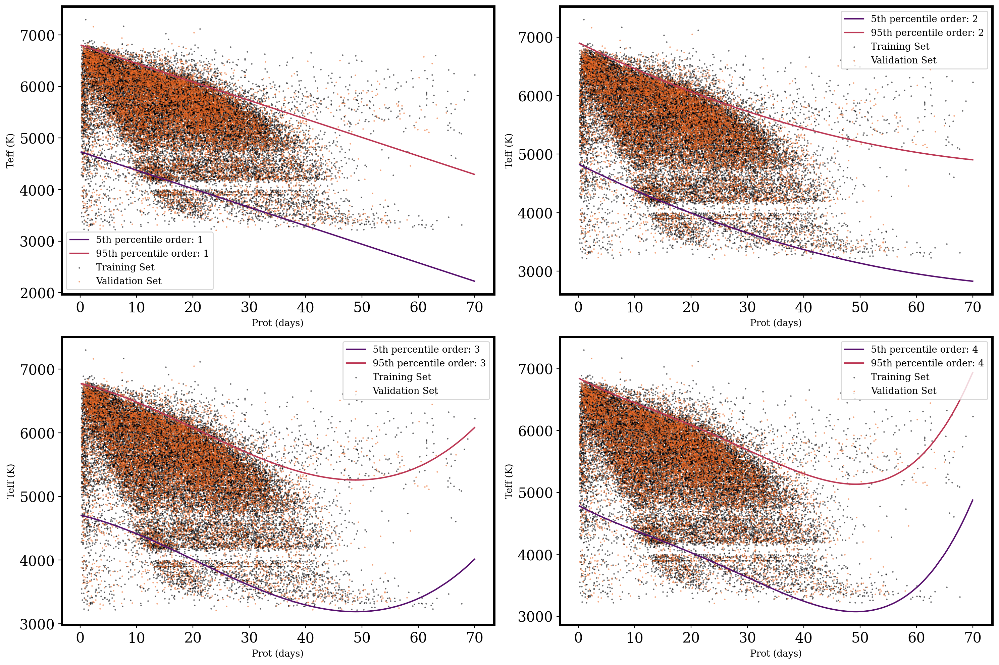

In [ ]:
figure, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 10))

# List of axes
axes = [ax1, ax2, ax3, ax4]

# Streamlining color names/standardizing color coding
color_5th = '#57106e'
color_95th = '#bc3754'
color_validation = '#ed6925'
color_training = '#000004'

# Iterate over degrees and axes
for idx, degree in enumerate(degrees[:4]):
    ax = axes[idx]

    # Extract data
    coefficients = results[degree]['coefficients']
    y_fit = np.polyval(coefficients, xtra)
    lower_fit = results[degree]['lower_fit']
    upper_fit = results[degree]['upper_fit']

    # Plot 95th and 5th percentile fits
    ax.plot(xtra, lower_fit, color_5th, label=f'5th percentile order: {degree}')
    ax.plot(xtra, upper_fit, color_95th, label=f'95th percentile order: {degree}')

    #Plot training and validation sets
    ax.scatter(xtra, ytra, color=color_training, label='Training Set', s=0.5, alpha=0.5)
    ax.scatter(xval, yval, color=color_validation, label='Validation Set', s=0.5, alpha=0.5)


    ax.set_xlabel('Prot (days)')
    ax.set_ylabel('Teff (K)')
    ax.legend()

# Make the plot pretty
axis_border_width = 2.5
fontsize_axis_labels = 15

for ax in axes:
    ax.tick_params(axis='both', which='major', labelsize=fontsize_axis_labels)
    ax.spines['top'].set_linewidth(axis_border_width)
    ax.spines['left'].set_linewidth(axis_border_width)
    ax.spines['right'].set_linewidth(axis_border_width)
    ax.spines['bottom'].set_linewidth(axis_border_width)

plt.tight_layout()
plt.show()

In [ ]:
# Model selection: comparing (incredibly high) chi2 values
print(np.min(chi2_5th))
print(np.min(chi2_95th))

2923870.7301656827
1483588.8621939893


While the miniumum $χ^2$ for the 95th percentile is the 3rd degree fit and the minimum for the 5th percentile is the 4th degree fit,both seem to be slightly overfitted, perhaps (4th more so than the third). The first degree fit for Prot > 50 loses some integrity. Therefore: 2nd & 3rd degree fits seem best. (2nd degree also loses sem integrity Prot > 60 however that is such a small proportion of points).

##Envelope Comparison

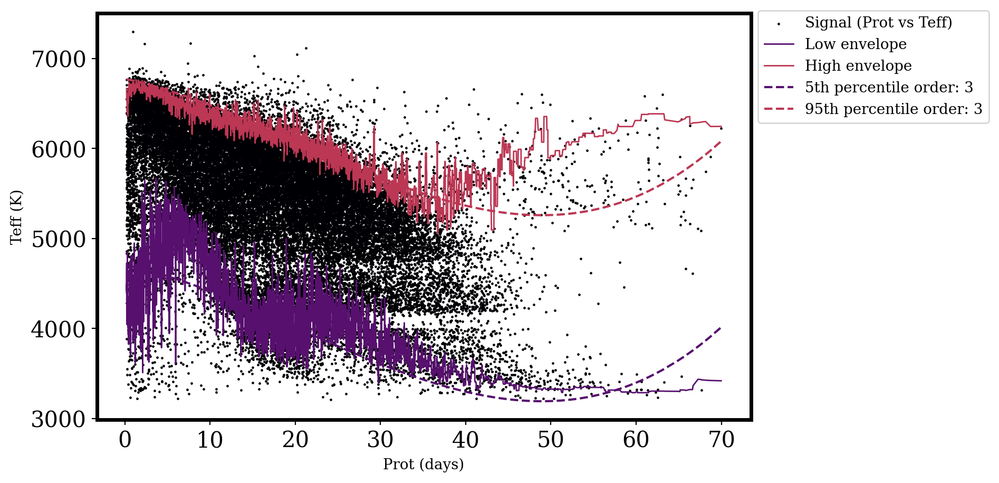

In [ ]:
figure, ax = plt.subplots(figsize=(8, 5))
ax.scatter(prot_sorted, teff_sorted, label="Signal (Prot vs Teff)", color="#000004", s = 0.5)
ax.plot(prot_sorted, low_env_teff, label="Low envelope", color="#57106e", linewidth=1)
ax.plot(prot_sorted, high_env_teff, label="High envelope", color="#bc3754", linewidth=1)
ax.plot(xtra, results[3]['lower_fit'], color_5th, linestyle='dashed',label='5th percentile order: 3')
ax.plot(xtra,  results[3]['upper_fit'], color_95th, linestyle='dashed', label='95th percentile order: 3')


ax.set_xlabel('Prot (days)')
ax.set_ylabel('Teff (K)')


#Per usual, make the plot pretty
ax.tick_params(axis='both', which='major', labelsize=fontsize_axis_labels)
ax.spines['top'].set_linewidth(axis_border_width)
ax.spines['left'].set_linewidth(axis_border_width)
ax.spines['right'].set_linewidth(axis_border_width)
ax.spines['bottom'].set_linewidth(axis_border_width)


ax.legend()
ax.legend(bbox_to_anchor=(1, 1.025))

#plt.tight_layout()
plt.show()

Polyfit 95th & 5th percentile fits seem to match envelopes pretty closely for Prot < 50 more or less

#**6. Stellar Properties Prediction**
Can you go further and predict other properties using Rrot/Prot/or
some combination versus M*/R*/logg/FeH/or some combination?

Use properities like masses to see if Prot can be constrained i.e can you predict rotation period from mass?

##Properties prediction with envelope function

In [ ]:
# Define the window size
window_size = 50 #this needs to be high given the volume of data, could be increased to smooth the signal but computationally expensive, if you will

# Extract the data from the merged_table
prot = merged_table['Prot']
rrot = merged_table['Rper']
mass = merged_table['Mass']
fe_h = merged_table['FeH']
logg = merged_table['logg']

# Sort data by Prot
sort = np.argsort(prot)
prot_sorted = prot[sort]
#rrot_sorted = rrot[sort]
mass_sorted = mass[sort]
feh_h_sorted = fe_h[sort]
logg_sorted = logg[sort]

#Sort data by Rper
sort_2 = np.argsort(rrot)
rrot_sorted = rrot[sort_2]
mass_sorted_2 = mass[sort_2]
feh_h_sorted_2 = fe_h[sort_2]
logg_sorted_2 = logg[sort_2]

# Compute envelopes with respect to Prot
low_env_mass, high_env_mass = sliding_window_envelope(mass_sorted, window_size)
low_env_feh, high_env_feh = sliding_window_envelope(feh_h_sorted, window_size)
low_env_logg, high_env_logg = sliding_window_envelope(logg_sorted, window_size)

#Compute envelopes wrt to Rrot
low_env_mass_2, high_env_mass_2 = sliding_window_envelope(mass_sorted_2, window_size)


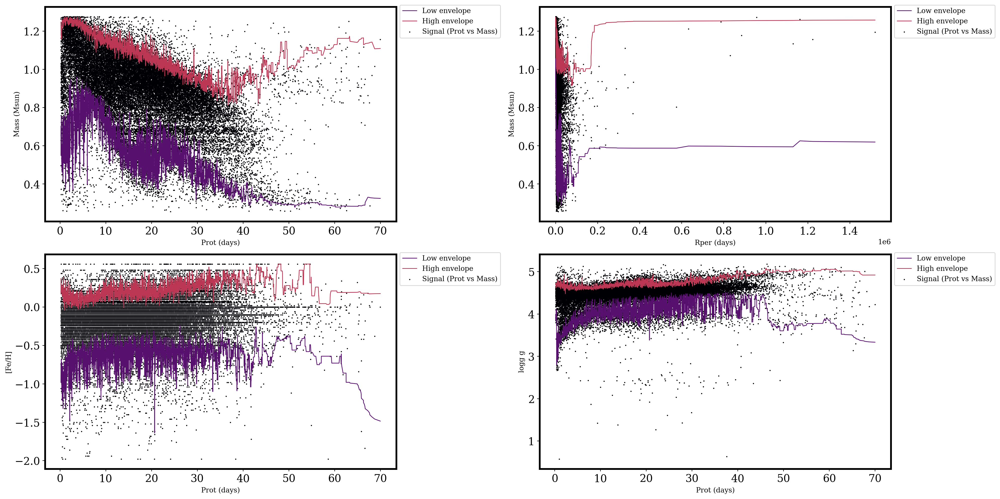

In [ ]:
figure, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 10))


# Plotting the data
ax1.plot(prot_sorted, low_env_mass,label="Low envelope", color="#57106e", linewidth=1)
ax1.plot(prot_sorted, high_env_mass,label="High envelope", color="#bc3754", linewidth=1)
ax1.scatter( prot_sorted,mass_sorted, label="Signal (Prot vs Mass)", color="#000004", s = 0.5)
ax1.set_xlabel('Prot (days)')
ax1.set_ylabel('Mass (Msun)')

ax2.plot(rrot_sorted, low_env_mass_2,label="Low envelope", color="#57106e", linewidth=1)
ax2.plot(rrot_sorted, high_env_mass_2,label="High envelope", color="#bc3754", linewidth=1)
ax2.scatter(rrot_sorted,mass_sorted_2, label="Signal (Prot vs Mass)", color="#000004", s = 0.5)
ax2.set_xlabel('Rper (days)')
ax2.set_ylabel('Mass (Msun)')

ax3.plot(prot_sorted, low_env_feh,label="Low envelope", color="#57106e", linewidth=1)
ax3.plot(prot_sorted, high_env_feh,label="High envelope", color="#bc3754", linewidth=1)
ax3.scatter(prot_sorted, feh_h_sorted, label="Signal (Prot vs Mass)", color="#000004", s = 0.5)
ax3.set_xlabel('Prot (days)')
ax3.set_ylabel('[Fe/H]')

ax4.plot(prot_sorted, low_env_logg,label="Low envelope", color="#57106e", linewidth=1)
ax4.plot(prot_sorted, high_env_logg,label="High envelope", color="#bc3754", linewidth=1)
ax4.scatter(prot_sorted,logg_sorted, label="Signal (Prot vs Mass)", color="#000004", s = 0.5)
ax4.set_xlabel('Prot (days)')
ax4.set_ylabel('logg g')

ax1.legend()
ax2.legend()
ax3.legend()
ax4.legend()

ax1.legend(bbox_to_anchor=(1, 1.025))
ax2.legend(bbox_to_anchor=(1, 1.025))
ax3.legend(bbox_to_anchor=(1, 1.025))
ax4.legend(bbox_to_anchor=(1, 1.025))


# Make the plot pretty
axis_border_width = 2.5
fontsize_axis_labels = 15

for ax in [ax1, ax2, ax3, ax4]:
    ax.tick_params(axis='both', which='major', labelsize=fontsize_axis_labels)
    ax.spines['top'].set_linewidth(axis_border_width)
    ax.spines['left'].set_linewidth(axis_border_width)
    ax.spines['right'].set_linewidth(axis_border_width)
    ax.spines['bottom'].set_linewidth(axis_border_width)

plt.tight_layout()
plt.show()


Parameters with respect to Prot are better constrained/predictable due to sparse Rrot outliers impacting envelope fit

In [ ]:
#Also try Temp. v. Mass since that is plotted (in log space) for the below isochrone

temp = merged_table['Teff']
sort_3 = np.argsort(temp)
temp_sorted = temp[sort_3]
mass_sorted_3 = mass[sort_3]

low_env_mass_3, high_env_mass_3 = sliding_window_envelope(mass_sorted_3, window_size)

Text(82.0, 0.5, 'Mass (Msun)')

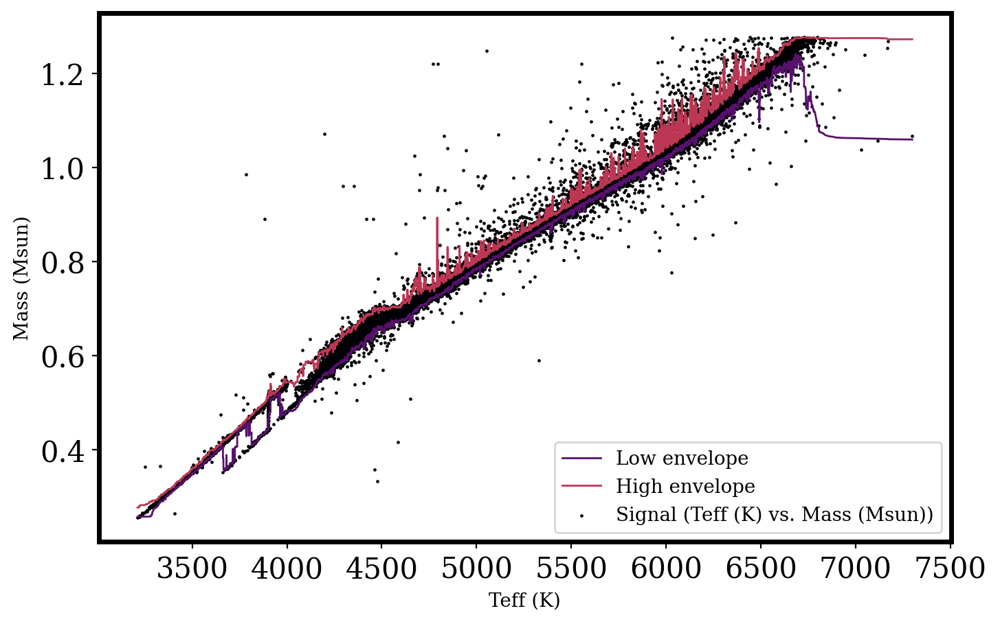

In [ ]:
# Plotting the data
fig, ax = plt.subplots(figsize=(8, 5))

ax.plot(temp_sorted, low_env_mass_3,label="Low envelope", color="#57106e", linewidth=1)
ax.plot(temp_sorted, high_env_mass_3,label="High envelope", color="#bc3754", linewidth=1)
ax.scatter(temp_sorted,mass_sorted_3, label="Signal (Teff (K) vs. Mass (Msun))", color="#000004", s = 0.5)
ax.set_xlabel('Teff (K)')
ax.set_ylabel('Mass (Msun)')
ax.legend()

ax.tick_params(axis='both', which='major', labelsize=fontsize_axis_labels)
ax.spines['top'].set_linewidth(axis_border_width)
ax.spines['left'].set_linewidth(axis_border_width)
ax.spines['right'].set_linewidth(axis_border_width)
ax.spines['bottom'].set_linewidth(axis_border_width)

Envelope seems to constrain these parameters, baring some outliers.

##For fun, try overplotting isochrones to constrain age like/in the vein of Fig. 5 of McQuillan paper

Overplotting isochrones on the data can help 1) explain trends (part 7) 2) constrain the ages in the catalog

In [ ]:
# The URL with isocrhone file
url = "https://github.com/jasoncurtis/Lessons/blob/main/GaiaDR2_Isochrones.dat?raw=true"
# Read the file using astropy.ascii.read()
isochrone_table = ascii.read(url, delimiter=r'\s')

In [ ]:
isochrone_table

log_Age,Initial_Mass,Mass,log_Lum,log_Temp,log_g,label,Gmag,G_BPmag,G_RPmag
float64,float64,float64,float64,float64,float64,int64,float64,float64,float64
8.0,0.0900000036,0.09,-2.755,3.4013,4.705,0,13.61,16.478,12.255
8.0,0.0931723565,0.093,-2.73,3.4048,4.708,0,13.546,16.415,12.192
8.0,0.1000000015,0.1,-2.675,3.4126,4.715,0,13.409,16.28,12.054
8.0,0.1009420455,0.101,-2.668,3.4135,4.716,0,13.392,16.263,12.037
8.0,0.1116045266,0.112,-2.593,3.4232,4.724,0,13.129,15.884,11.786
8.0,0.1200000122,0.12,-2.538,3.431,4.731,0,12.887,15.49,11.561
8.0,0.1400000006,0.14,-2.432,3.4434,4.741,0,12.474,14.871,11.172
8.0,0.142202422,0.142,-2.421,3.4447,4.742,0,12.432,14.809,11.133
8.0,0.1599999964,0.16,-2.338,3.4543,4.75,0,12.114,14.333,10.837


In [ ]:
# Define a function that locates the place in an array where the entry is closest to a requested value:
def find_element(value, array):
  absolute_difference = abs(array - value)
  location_of_element_nearest_to_value = np.argmin(absolute_difference)
  return location_of_element_nearest_to_value

In [ ]:
# Define a function that pulls out one isochrone (one age) out of the grid.

# This function will also introduce interstellar extinction (dims Gmag) and reddening (increases BP-RP).
# This is parameterized with $A_V$, the extinction in the visual $V$ band.
# The extinction in other bands can be calculated from A_V using "extinction coefficients"


def get_isochrone(age, Av = 0.0):
  # Note: Input age must be in millions of years (Myr)

  #
  unique_ages_in_isochrone_table = np.unique(isochrone_table['log_Age'])

  #
  location_of_nearest_age_in_isochrone = find_element(age, 10**unique_ages_in_isochrone_table/1e6)

  #
  nearest_age_in_isochrone = unique_ages_in_isochrone_table[location_of_nearest_age_in_isochrone]

  #
  find_matching_ages = np.where((isochrone_table['log_Age'] == nearest_age_in_isochrone) &
                                (isochrone_table['label']<7)
                                )[0]

  # extract isochrone at the given age
  isochrone_at_input_age = isochrone_table[find_matching_ages]

  #
  isochrone_at_input_age['BP-RP'] = isochrone_at_input_age['G_BPmag'] - isochrone_at_input_age['G_RPmag']

  # Correct photometry for interstellar reddening and extinction
  isochrone_at_input_age['Gmag'] += 0.86*Av
  isochrone_at_input_age['BP-RP'] += 0.415*Av

  isochrone_at_input_age.remove_columns(['G_BPmag', 'G_RPmag'])

  # return
  return isochrone_at_input_age

In [ ]:
Age_1 = 1000
Age_2 = 4.5 * Age_1
Age_3 = 10 * Age_1
Av = 0.0
my_isochrone_1 = get_isochrone(Age_1, Av=Av)
my_isochrone_2 = get_isochrone(Age_2, Av=Av)
my_isochrone_3 = get_isochrone(Age_3, Av=Av)

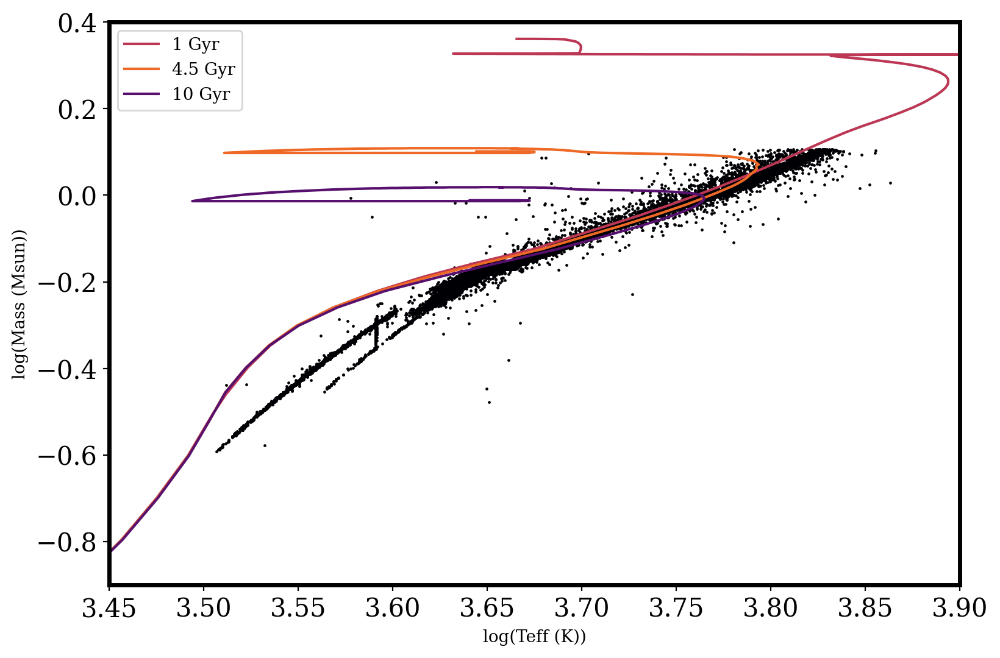

In [ ]:
fig, ax = plt.subplots(figsize=(9, 6))

ax.scatter(np.log10(merged_table['Teff']), np.log10(merged_table['Mass']), color="#000004", s = 0.5)
ax.plot(my_isochrone_1['log_Temp'], np.log10(my_isochrone_1['Mass']), color="#bc3754", label = '1 Gyr')
ax.plot(my_isochrone_2['log_Temp'], np.log10(my_isochrone_2['Mass']), color="#ed6925", label = '4.5 Gyr')
ax.plot(my_isochrone_3['log_Temp'], np.log10(my_isochrone_3['Mass']), color="#57106e", label = '10 Gyr')

ax.set_xlim(3.45, 3.9)
ax.set_ylim(-0.9, 0.4)

ax.set_xlabel('log(Teff (K))')
ax.set_ylabel('log(Mass (Msun))')
ax.legend()

#Per usual, make the plot pretty
ax.tick_params(axis='both', which='major', labelsize=fontsize_axis_labels)
ax.spines['top'].set_linewidth(axis_border_width)
ax.spines['left'].set_linewidth(axis_border_width)
ax.spines['right'].set_linewidth(axis_border_width)
ax.spines['bottom'].set_linewidth(axis_border_width)


Based on isochrones: ages of stars in data appear to be constrained between 1 Gyr and 4.5 Gyr. Therefore, can reasonably predict age from parameters in dataset? (Unfortunately this isochrone data does not have rotation period data, as age can be predicted from rotation period data (gyrochronology)).

#**7. Trend explanation**

Try to explain the trends you see, don’t forget about selection bias in
the sample, such as M-dwarfs being quite rare

In [ ]:
print(np.min(merged_table['Teff']))
print(np.max(merged_table['Teff']))

3211
7299


The catalog features F,G,K type stars, roughly speaking, based on the temperature range 3211 K - 7299 K. M type stars, for instance, have a temperature of T < 3500 K. Conversely, O, B, and A type stars have temperatures greater than 10,000 K. Thus, the selection bias primarily favors stars in the main sequence. (Before main-sequence turn off).

This also explains the other parameter constraints/limitations. Moreover, this explains why the ages of the stars in these catalogs (per the above isochrone) are constrained to the Gyr regime (neglecting younger stars in the Myr regime).